### Final Project Report for New Methods in Earth Observation
Adeline Akansobe, Kwabena Antwi, André Luiz de Oliveira Domingues

Fall 2023 - Professor Lyndon Estes

####**Description and Objectives**

Large-scale, current, and accurate land cover maps are essential for many environmental applications, including the management of natural resources, the preservation of biodiversity, and the evaluation of food security (Song et al., 2023). Over the last twenty years, high-resolution satellite imagery has gradually created new opportunities for the timely mapping of land cover across vast areas (Tong et al., 2023). In a review of remote sensing, Rogan and Chen (2004) highlighted how rapid technological advancement can generate reliable information for planning and land management. Our capacity to track and investigate changes in land use and land cover has improved because of new instruments and methods, many of which are founded on the collaborative application of disciplinary theory and knowledge (Verburg et al., 2009).  To determine crop type and cropping intensity based on crop phenologies, previous techniques have relied on high temporal-resolution datasets such as MODIS. Sakamoto et al. (2018) discovered, for instance, that the distinct phenological signature of field flooding and rice transplanting early in the growing season may be used to reliably identify rice from other monsoon crops in South Asia.

Smallholder farmers are especially susceptible to environmental change on a global scale, including climatic variability and change since they use low-intensity farming methods to cultivate their crops. By determining which agricultural regions are most susceptible to environmental and global changes, scientists and policymakers may create measures to help farmers deal with climate change (Jain et al., 2013). Analyses of satellite images provide a feasible means of detecting cropping patterns across wide areas in various parts of the world (Jain et al., 2013). Specifically, in mapping farm management and yield outcomes at broad geographical scales, it is required to first map crop types at the field resolution. Given that the number of people living in areas experiencing food insecurity is still rising and that climate change is expected to have a negative impact on global agriculture, this mission is even more pressing (Kluger et al., 2021). Tackling this challenge involves the creation of models that can effectively generalize from limited labeled data, thereby expanding our capacity to address a wider array of Earth observation tasks (Bourcier et al., 2022). To expand the use of machine learning applications to where labeled datasets are scarce, this problem has sparked research on self-supervised learning for remote sensing data.

In this project, we will employ the pre-trained Remote Sensing Transformer (Presto), a transformer-based model pre-trained on remote sensing pixel-time-series data for the downstream task of mapping agricultural fields in Africa. Tseng et al. (2023) claim that the Presto model can handle a variety of tasks, landscapes, and data sizes and requires lower computing power than other popular models. The project will adapt their [downstream_task_demo.ipynb](https://github.com/nasaharvest/presto/blob/main/downstream_task_demo.ipynb) notebook to run on Sentinel-2 data with labels for agricultural fields in Kenya's Busia County ([Kenya Cropland Map and Non-Crop Labelled dataset](https://zenodo.org/records/4271144): busia_cropland_binary_2020.tif.zip). The goal of the project is to determine the viability of using this foundational model for future research that requires the mapping of agricultural fields. Our specific objective is to segment the satellite imagery into two (cropfield/not cropfield) or three (cropfield/cropfield border/not cropfield) classes.

####**Methods**

In our project, we customized the original notebook to showcase the practical application of the Presto package in downstream tasks, specifically focusing on predicting crop boundaries through mapping. Despite Presto being initially trained on a different dataset, we adapted the notebook for tree-type mapping using single-timestep images. The model code and the benchmark dataset are accessible from [TreeSat](https://essd.copernicus.org/articles/15/681/2023/) or from [Zenodo](https://zenodo.org/record/6780578) and unzipped in the [treesat folder](data/treesat).
The provided data comprises TreeSat Sentinel 2 (S2) data for 60m and 200m resolutions. For our purposes, we utilized the 60m x 60m images from areas with trees in Germany, employing them in the initial training and validation of the Presto model. Each train and test TIF tile consists of 6 by 6 pixel chips, totaling 36 pixels at a 10m resolution. The included bands are ["B2", "B3", "B4", "B8", "B5", "B6", "B7", "B8A", "B11", "B12", "B1", "B9"].

The data encompasses labeled information for several tree species including *Larix_kaempferi, Pinus_nigra, Tilia_spec., Betula_spec., Fraxinus_excelsior, Populus_spec*., etc, but our model was specifically trained for predicting two and three tree species, thus we generated predictions 1 for *Abies_alba* (0) and *Acer_pseudoplatanus* (1); prediction 1 for *Pinus_nigra* (0) and *Fraxinus_excelsior* (1) and prediction 3 for *Pinus_nigra* (0), *Fraxinus_excelsior* (1) and *Tilia_spec* (3). All these predictions were run seperately.

In enhancing the code, we modified each prediction to extract all 36 pixels from the input data chips, deviating from the original notebook, which only extracted 9 pixels. This modification resulted in the construction of 3430 training files and 375 test files for prediction 1 and 2756 train files and 299 test files for prediction 2, as well as 2946 training files and 321 test files for prediction 3. Subsequently, the train and test files were processed using presto_construct_single_presto_input to transform each file into tensors encompassing arrays, masks, dynamic worlds, latlons, tree labels and the image names.
These tensors, along with the month (July, during which train pixels from e TreeSat AI dataset was collected. These were reconstructed into training and testing datasets. We then loaded the pretrained Presto model using Presto.load_pretrained() with the reconstructed trained dataset and then extracted the train features which we used to train a random forest classifier.
To facilitate the prediction of test file pixels, we utilized the pretrained Presto model on the reconstructed test dataset. The model outputs were employed to generate a prediction band on the test files, revealing the classification of each pixel by species. The calculated F1 scores for the test predictions were found to be 0.971, 0.978 and 0.915 respectively for predictions 1, 2 and 3. Ultimately, we exported the predicted test files both as TIFFs and transformed them into Cloud-Optimized Geotiffs (COGs) for visualization purposes.



###**Results for two species (Abies_alba and Acer_pseudoplatanus prediction)**

#### **Figure 1: Prediction proportions of each pixel in each test tile**
The sizes of a pixel's species proportion determine the assigned a prediction for that particular pixel. E.g. Pixel [0] has species proportion of 0.26 for species 0 and 0.726 for *Acer_pseudoplatanus* (1). The prediction proportion of 1 higher than 0, thus the image is assigned a prediction value of 1.

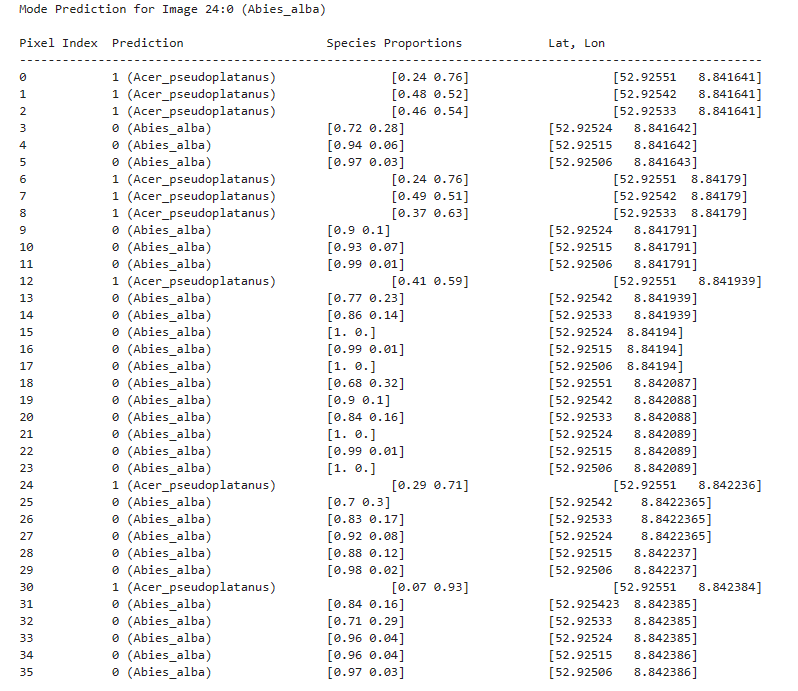

**Figure 2: Distribution of tree species in each prediction image.**

The x-axis show all the 375 test data which the random forest classifier
was used for the prediction. While the y-axis show the prediction proportion of the species for each of the 36 pixels per each test data image. From the predictions, we categorized the predicted test data based on the majority of pixels in each image per each specie. From this categorization, a total of 26% of the 375 test images has majority of the pixels prediction being *Albies_alba* species. While the 74% of all the predictions had a majority of *Acer_pseudoplatanus* species.

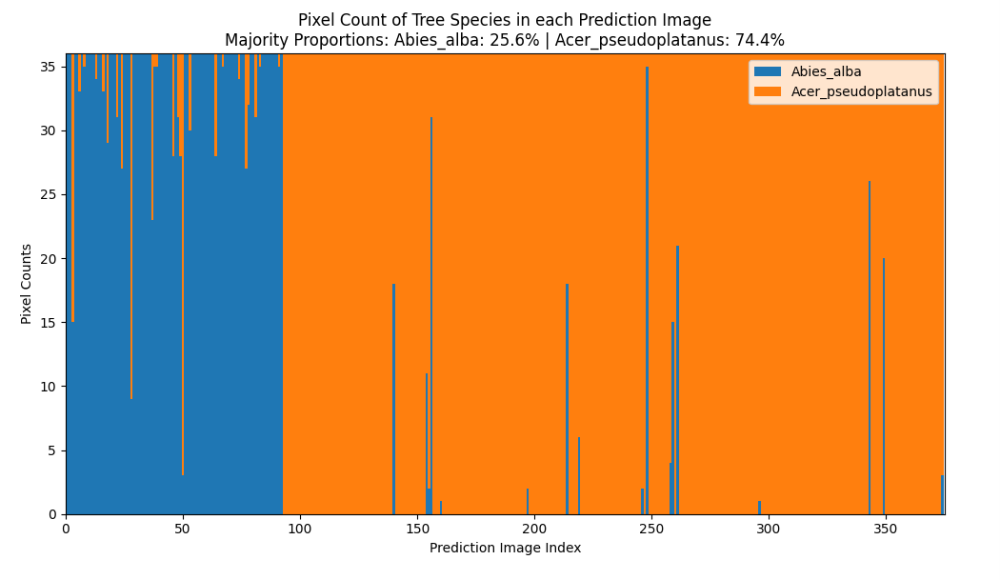

####**Imports and drive mounts for all results**

In [ ]:
%%capture
%pip install localtileserver
%pip install leafmap

In [ ]:
import os
import rasterio
from rasterio.warp import transform_bounds
import leafmap.leafmap as leafmap
import localtileserver
import random
import pyproj

In [ ]:
from google.colab import drive
root = '/content/gdrive'
drive.mount(root)

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


####**Paths for prediction files and distribution of all tree species based on majority for each species.**
Prediction files are shared at this [link](https://drive.google.com/drive/folders/1BbLmIVAMgQ5bwCI9wiuv7ho6CCWWn7xa?usp=drive_link).

The prediction files were divided into two species. All *Abies_alba* (species 0) are saved in species [link](https://drive.google.com/drive/folders/1PzUosNUJnEk-ofZpZ7JiWKswEBHDvMn8?usp=drive_link).

All *Acer_pseudoplatanus* (species_1) are saved in species [link](https://drive.google.com/drive/folders/1KoXYGZdLsMhXcyjKNe8DOg9-ZwEUcQlL?usp=drive_link).

In [ ]:
# Actual test file for the mixed classes
test_dir = f"{root}/MyDrive/EarthObservations/Presto_Project/data/Test_files"

# Path to folder
predictions_dir = f"{root}/MyDrive/EarthObservations/Presto_Project/data/predictions"
species0_dir = f"{predictions_dir}/mode_species0"
species1_dir = f"{predictions_dir}/mode_species1"

# # File paths
prediction24_cog = f"{predictions_dir}/" \
     "Abies_alba_3_2646_WEFL_NLF_predicted_24_cog.tif"

#actual image of abies_alba_24
test24 = f"{test_dir}/" \
     "Abies_alba_3_2646_WEFL_NLF.tif"

####**Spatial Distribution of tree species**

Figure 3 shows the spatial distribution of the predicted 375 tree species test data in Germany. *Abies_alba* are predominantly in northern Germany, and *Acer_pseudoplatanus* are predominant species in southern Germany.

In [ ]:
# Function to get the center (lat, lon) of a raster in EPSG:4326
def get_raster_center(raster_path):
    with rasterio.open(raster_path) as src:
        bounds = src.bounds
        lon = (bounds.left + bounds.right) / 2
        lat = (bounds.bottom + bounds.top) / 2
        # Perform coordinate transformation to EPSG:4326
        transformer = pyproj.Transformer.from_crs(src.crs, 'EPSG:4326', always_xy=True)
        lon, lat = transformer.transform(lon, lat)
        lat = lat
    return lat, lon

# Create a Leafmap map centered at an initial location
m = leafmap.Map(center=[52.4, 9.5], zoom=7)

# List and process the TIFF files in species0_dir
species0_files = [f for f in os.listdir(species0_dir) if f.endswith('.tif')]

#print(species0_files_count)
for filename in species0_files:
    filepath = os.path.join(species0_dir, filename)
    lat, lon = get_raster_center(filepath)
    # White markers for species 0
    m.add_markers([lat, lon], shape='circle', color='#FFFFFF')


# List and process the TIFF files in species1_dir
species1_files = [f for f in os.listdir(species1_dir) if f.endswith('.tif')]
for filename in species1_files:
    filepath = os.path.join(species1_dir, filename)
    lat, lon = get_raster_center(filepath)
    # Red markers for species 1
    m.add_markers([lat, lon], shape='circle', color='#ff0000')


labels = ['Abies_alba', 'Acer_pseudoplatanus']

colors = ['#FFFFFF', '#ff0000']


m.add_legend(title='Legend', labels=labels,
             colors=colors)

# Add basemap
m.add_basemap("SATELLITE")

# Display the map
m

Map(center=[52.4, 9.5], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_…

#### **Figure 3: Spatial distribution of the predicted 375 tree species test data in Germany.**
*Abies_alba* are predominantly in northern Germany, and 8Acer_pseudoplatanus* are predominant species in southern Germany.

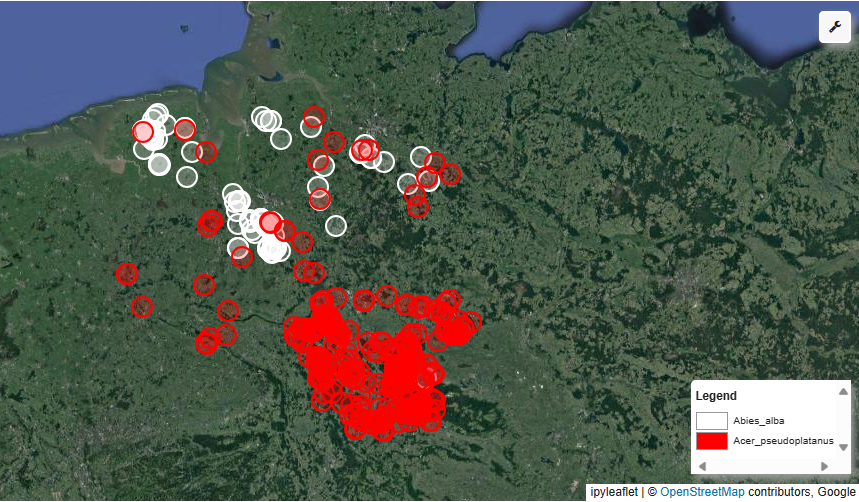

####**Visualize 10 Randomly selected images that has majority of species 0 and species 1**

These Random predicted images with majority of the the 36 pixels in the 6 x 6 image predicted as *Abies_alba* species or *Acer_pseudoplatanus* species.

In [ ]:
# Set a seed for reproducibility
random.seed(42)

# List files in each directory
species0_files = [os.path.join(species0_dir, f) for f in os.listdir(species0_dir) if f.endswith('.tif')]
species1_files = [os.path.join(species1_dir, f) for f in os.listdir(species1_dir) if f.endswith('.tif')]

# Randomly select up to 10 rasters from each category
selected_species0 = random.sample(species0_files, min(len(species0_files), 10))
selected_species1 = random.sample(species1_files, min(len(species1_files), 10))

# Print selected file names
print('Selected Abies_alba (species0) images:')
for filepath in selected_species0:
    print(os.path.basename(filepath))
print()

print('Selected Acer_pseudoplatanus (species1) images:')
for filepath in selected_species1:
    print(os.path.basename(filepath))

Selected Abies_alba (species0) images:
Abies_alba_4_3175_WEFL_NLF_predicted_60_cog.tif
Abies_alba_3_4561_WEFL_NLF_predicted_39_cog.tif
Abies_alba_4_233017_BI_NLF_predicted_54_cog.tif
Acer_pseudoplatanus_4_7623_WEFL_NLF_predicted_343_cog.tif
Abies_alba_3_2623_WEFL_NLF_predicted_22_cog.tif
Abies_alba_2_1440_WEFL_NLF_predicted_1_cog.tif
Abies_alba_3_258571_BI_NLF_predicted_20_cog.tif
Abies_alba_3_2054_WEFL_NLF_predicted_13_cog.tif
Abies_alba_4_1190_WEFL_NLF_predicted_47_cog.tif
Abies_alba_4_339150_BI_NLF_predicted_61_cog.tif

Selected Acer_pseudoplatanus (species1) images:
Acer_pseudoplatanus_2_6277_WEFL_NLF_predicted_175_cog.tif
Acer_pseudoplatanus_3_7679_WEFL_NLF_predicted_291_cog.tif
Acer_pseudoplatanus_1_5956_WEFL_NLF_predicted_107_cog.tif
Acer_pseudoplatanus_1_7127_WEFL_NLF_predicted_117_cog.tif
Acer_pseudoplatanus_1_9028_WEFL_NLF_predicted_136_cog.tif
Acer_pseudoplatanus_2_7123_WEFL_NLF_predicted_192_cog.tif
Acer_pseudoplatanus_2_8928_WEFL_NLF_predicted_217_cog.tif
Acer_pseudoplatan

In [ ]:
# Create a Leafmap map centered at an initial location
# Use the center of the first raster as initial location
initial_location = get_raster_center(selected_species0[0])
m = leafmap.Map(center=initial_location, zoom=18)

# Add basemap
m.add_basemap("SATELLITE")

# Define a binary palette (0: white, 1: red) using hex codes
binary_palette = ['#FFFFFF', '#ff0000']
#Problem displaying secies1 as red, forcing red for now
binary_palette2 = ['#ff0000', '#ff0000']

# Add selected rasters and markers
for cog in selected_species0:
    lat, lon = get_raster_center(cog)
    marker_color = '#FFFFFF' #white
    m.add_markers([lat, lon], shape='circle', color=marker_color)
    m.add_raster(cog, band=13, palette=binary_palette)

for cog in selected_species1:
    lat, lon = get_raster_center(cog)
    marker_color = '#ff0000' #red
    m.add_markers([lat, lon], shape='circle', color=marker_color)
    m.add_raster(cog, band=13, palette=binary_palette2)

labels = ['Abies_alba', 'Acer_pseudoplatanus']

colors = ['#FFFFFF', '#ff0000']
m.add_legend(title='Legend', labels=labels,
             colors=colors)


# Display the map
m


Map(center=[53.405627588732166, 7.444095440736899], controls=(ZoomControl(options=['position', 'zoom_in_text',…

ERROR:flask_caching:Exception possibly due to cache backend.
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/flask_caching/__init__.py", line 408, in decorated_function
    self.cache.set(
  File "/usr/local/lib/python3.10/dist-packages/cachelib/simple.py", line 79, in set
    self._prune()
  File "/usr/local/lib/python3.10/dist-packages/cachelib/simple.py", line 56, in _prune
    self._remove_expired(now)
  File "/usr/local/lib/python3.10/dist-packages/cachelib/simple.py", line 37, in _remove_expired
    toremove = [k for k, (expires, _) in self._cache.items() if expires < now]
  File "/usr/local/lib/python3.10/dist-packages/cachelib/simple.py", line 37, in <listcomp>
    toremove = [k for k, (expires, _) in self._cache.items() if expires < now]
RuntimeError: dictionary keys changed during iteration


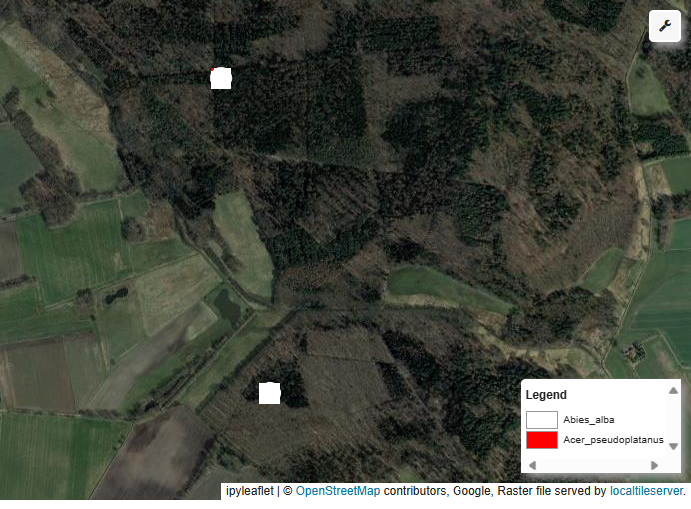

####**Display rasters for both species with mixed tree values.**

We display images that were classifed as 0 - *Abies_alba* but had mixed classification of the 36 images.

These imaged are saved in [Link](https://drive.google.com/drive/folders/1MyrzUp8w7LxP1F8MGP9vzMeag5Lx-e6Z?usp=drive_link).  And images that were classified as 1 - *Acer_pseudoplatanus* but had
mixed classification of the 36 images. These can be found [Link](https://drive.google.com/drive/folders/18c_XBppIGnONcp2BxY6cxR44vPqDsESP?usp=drive_link)

In [ ]:

# list of actual mixed species
testfiles_0 = [
    f"{test_dir}/Abies_alba_3_2646_WEFL_NLF.tif",
    f"{test_dir}/Abies_alba_4_1252_WEFL_NLF.tif",
    f"{test_dir}/Abies_alba_9_1218_WEFL_NLF.tif",
    f"{test_dir}/Abies_alba_3_3357_WEFL_NLF.tif",
    f"{test_dir}/Abies_alba_4_174939_BI_NLF.tif",]

testfiles_1 = [
    f"{test_dir}/Acer_pseudoplatanus_2_228667_BI_NLF.tif",
    f"{test_dir}/Acer_pseudoplatanus_2_259266_BI_NLF.tif",
    f"{test_dir}/Acer_pseudoplatanus_2_9018_WEFL_NLF.tif",
    f"{test_dir}/Acer_pseudoplatanus_9_8725_WEFL_NLF.tif",
    ]


# List of Species classified as 0 with mixed classes
prediction_0_mixed = [
    f"{species0_dir}/Abies_alba_3_2646_WEFL_NLF_predicted_24_cog.tif",
    f"{species0_dir}/Abies_alba_4_1252_WEFL_NLF_predicted_48_cog.tif",
    f"{species0_dir}/Abies_alba_9_1218_WEFL_NLF_predicted_78_cog.tif",
    f"{species0_dir}/Abies_alba_3_3357_WEFL_NLF_predicted_28_cog.tif",
    f"{species0_dir}/Abies_alba_4_174939_BI_NLF_predicted_50_cog.tif"]

# List of Species classified as 1 with mixed classes
prediction_1_mixed = [
    f"{species1_dir}/Acer_pseudoplatanus_2_228667_BI_NLF_predicted_154_cog.tif",
    f"{species1_dir}/Acer_pseudoplatanus_2_259266_BI_NLF_predicted_155_cog.tif",
    f"{species1_dir}/Acer_pseudoplatanus_2_9018_WEFL_NLF_predicted_219_cog.tif",
    f"{species1_dir}/Acer_pseudoplatanus_9_8725_WEFL_NLF_predicted_374_cog.tif"]

In [ ]:
m = leafmap.Map(center=initial_location, zoom=18)

# Add basemap
m.add_basemap("SATELLITE")

# Define a binary palette (0: white, 1: red) using hex codes
binary_palette = ['#FFFFFF', '#ff0000']
#Problem displaying secies1 as red, forcing red for now
binary_palette2 = ['#ff0000', '#ff0000']

# Add selected Actual images
for tiff in testfiles_0:
        # actual test file
    m.add_raster(tiff, band=2, palette=binary_palette,
                 layer_name='Test 1')

for tiff in testfiles_1:
        # actual test file
    m.add_raster(tiff, band=2, palette=binary_palette,
                 layer_name='Test 2')



# Add selected rasters and markers
for cog in prediction_0_mixed:
    lat, lon = get_raster_center(cog)
    marker_color = '#FFFFFF' #white
    m.add_markers([lat, lon], shape='circle', color=marker_color)
    m.add_raster(cog, band=13, palette=binary_palette)

for cog in prediction_1_mixed:
    lat, lon = get_raster_center(cog)
    marker_color = '#ff0000' #red
    m.add_markers([lat, lon], shape='circle', color=marker_color)
    m.add_raster(cog, band=13, palette=binary_palette)


labels = ['Abies_alba', 'Acer_pseudoplatanus']

colors = ['#FFFFFF', '#ff0000']
m.add_legend(title='Legend', labels=labels,
             colors=colors)
# Display the map
m

Map(center=[53.405627588732166, 7.444095440736899], controls=(ZoomControl(options=['position', 'zoom_in_text',…

### **Figure 4: Predicted image of Abies_alba with mixed Acer_pseudoplatanus**
Predicted image as *Abies_alba*that has mixed prediction with 32 pixels predicted as *Abies_alba* species and 4 pixels predicted as *Acer_pseudoplatanus*.

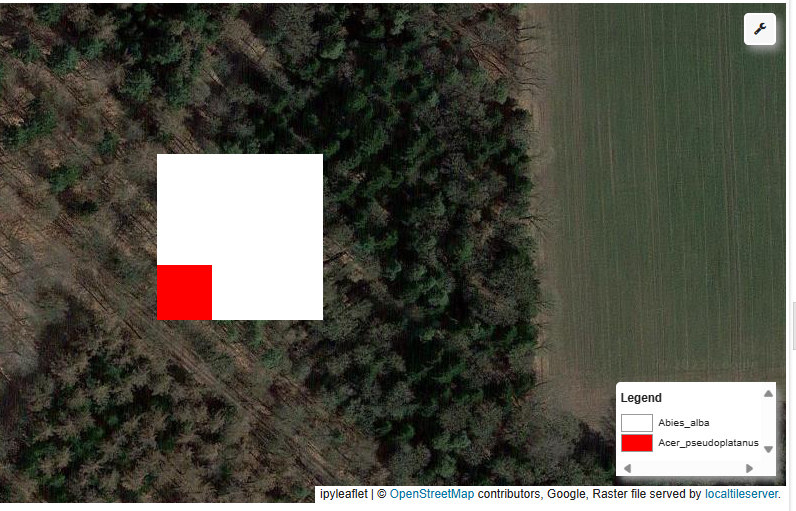

### **Figure 5: Predicted image of Acer_pseudoplatanus with mixed Abies_alba**
Predicted image as *Acer_pseudoplatanus* that has mixed prediction of 24 pixels predicted as *Acer_pseudoplatanus* and 12 pixels predicted as *Abies_alba* species.

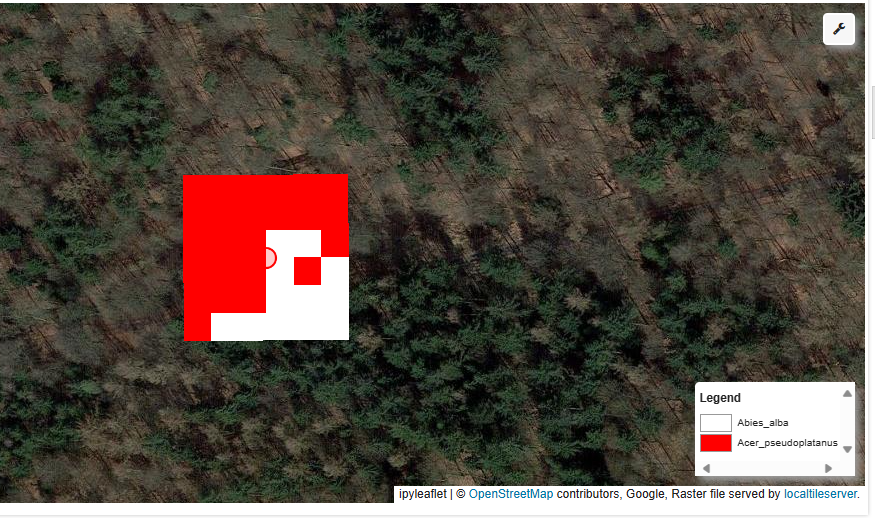

###**Results for two species (Pinus_nigra and Fraxinus_excelsior)**

#### **Figure 6. Distribution of tree species in each prediction image.**

The x-axis show all the 299 test data which a random forest classifier
was used for the prediction. While the y-axis show the prediction proportion of
the species for each of the 36 pixels per each test data image. From the predictions, we catergorized the predicted test data based on the majority of pixels in each image per each species. From this categorization, a total of 12.7% of the 375 test images has majority of the pixels prediction being *Pinus_nigra* species. While the 87.3% of all the predictions had a majority of *Fraxinus_excelsior* species.

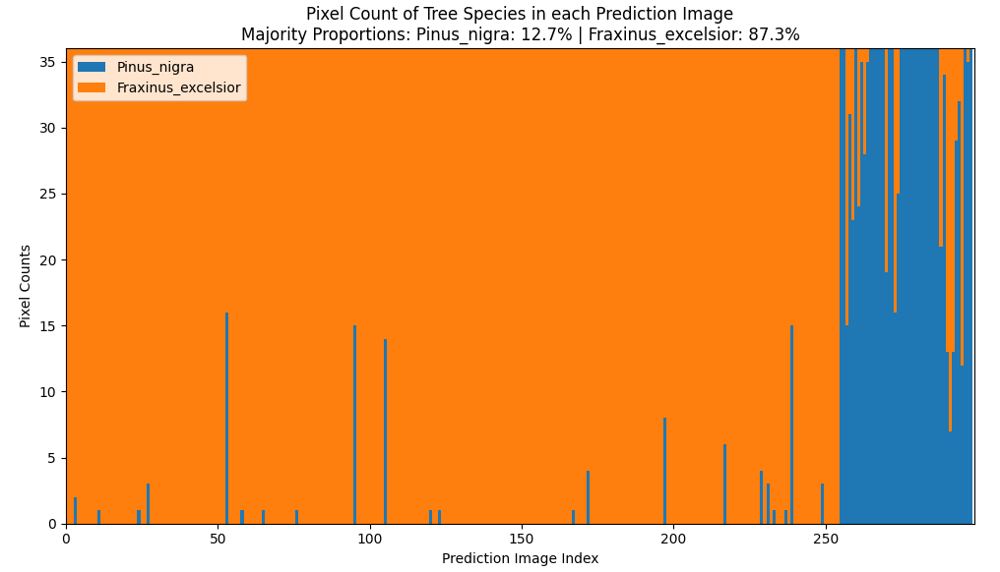

#### Paths for prediction files and distribution of all tree species (Pinus_nigra and Fraxinus_excelsior) based on majority for each species.
Prediction files are shared at this [link](https://drive.google.com/drive/folders/1ptCCcaZVrW9MAsWnMIQ5lssLRi9oWj5e?usp=drive_link).

The prediction files were divided into two species. All Pinus_nigra (species 0) are saved in species [link](https://drive.google.com/drive/folders/1v70U9AT6qyvFSeQ26yTNqcVwL0TbFPec?usp=drive_link).

All Fraxinus_excelsior (species_1) are saved in species [link](https://drive.google.com/drive/folders/1qyCvX7jmaE2gWDrrk3wCFhQ-peFFVVH8?usp=drive_link).

In [ ]:
# Actual test file for the mixed classes
test_dir = f"{root}/MyDrive/EarthObservations/Presto_Project/data/Test_files"

# Path to folder
predictions_dir = f"{root}/MyDrive/EarthObservations/Presto_Project/data/predictions2"
species0_dir = f"{predictions_dir}/mode_species0"
species1_dir = f"{predictions_dir}/mode_species1"

# # File paths
prediction24_cog = f"{predictions_dir}/" \
     "Fraxinus_excelsior_2_30386_WEFL_NLF_predicted_24_cog.tif"

#actual image of Fraxinus_excelsior_24
test24 = f"{test_dir}/" \
     "Fraxinus_excelsior_2_30386_WEFL_NLF.tif"

#### Spatial distribution of the predicted 299 tree species test data in Germany.

In [ ]:
# Function to get the center (lat, lon) of a raster in EPSG:4326
def get_raster_center(raster_path):
    with rasterio.open(raster_path) as src:
        bounds = src.bounds
        lon = (bounds.left + bounds.right) / 2
        lat = (bounds.bottom + bounds.top) / 2
        # Perform coordinate transformation to EPSG:4326
        transformer = pyproj.Transformer.from_crs(src.crs, 'EPSG:4326', always_xy=True)
        lon, lat = transformer.transform(lon, lat)
        lat = lat
    return lat, lon

# Create a Leafmap map centered at an initial location
m = leafmap.Map(center=[52.4, 9.5], zoom=7)

# List and process the TIFF files in species0_dir
species0_files = [f for f in os.listdir(species0_dir) if f.endswith('.tif')]
#species0_files_count = len(species0_files)
#print(species0_files_count)
for filename in species0_files:
    filepath = os.path.join(species0_dir, filename)
    lat, lon = get_raster_center(filepath)
    # White markers for species 0
    m.add_markers([lat, lon], shape='circle', color='#FFFFFF')

# List and process the TIFF files in species1_dir
species1_files = [f for f in os.listdir(species1_dir) if f.endswith('.tif')]
for filename in species1_files:
    filepath = os.path.join(species1_dir, filename)
    lat, lon = get_raster_center(filepath)
    # Red markers for species 1
    m.add_markers([lat, lon], shape='circle', color='#ff0000')


labels = ['Pinus_nigra', 'Fraxinus_excelsior']

colors = ['#FFFFFF', '#ff0000']


m.add_legend(title='Legend', labels=labels,
             colors=colors)

# Add basemap
m.add_basemap("SATELLITE")

# Display the map
m

Map(center=[52.4, 9.5], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_…

#### **Figure 7: Spatial distribution of the predicted 299 tree species test data in Germany.**


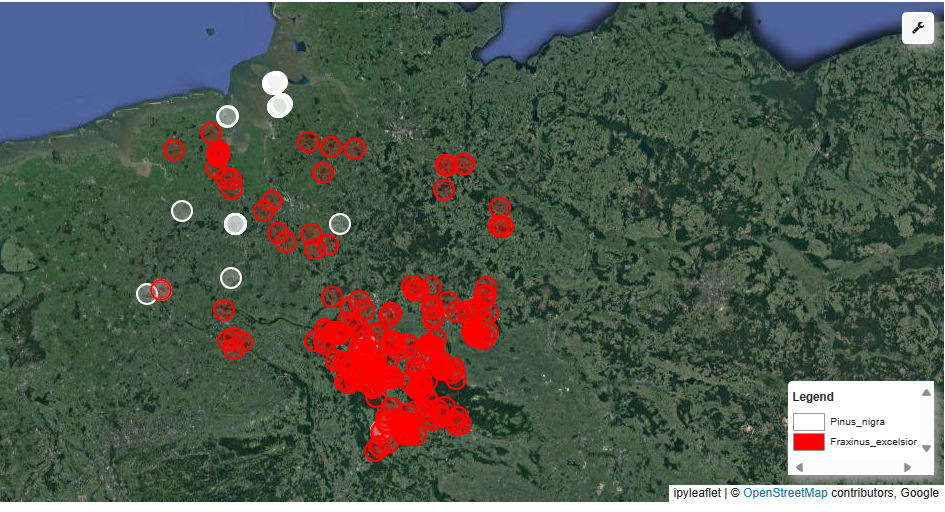

####**Display rasters for both species with mixed tree values.**
We display 5 images that were classifed as 0 - Pinus_nigra but had mixed prediction of the 36 images.

These imaged are saved in [Link](https://drive.google.com/drive/folders/1aNw1NO0Mc-x8gThQQkOJI4lxOB0qraE0?usp=drive_link)

 And 5 images that were classifed as 1 - Fraxinus_excelsior but had mixed prediction of the 36 images.

 These can be found [Link](https://drive.google.com/drive/folders/1CY4DOiHWnY_B2-g4E5ZgC1yYa5Ex1L_w?usp=drive_link)

In [ ]:
# list of actual mixed species
testfiles_0 = [
    f"{test_dir}/Pinus_nigra_3_53993_WEFL_NLF.tif",
    f"{test_dir}/Pinus_nigra_4_53059_WEFL_NLF.tif",
    f"{test_dir}/Pinus_nigra_6_51134_WEFL_NLF.tif",
    f"{test_dir}/Pinus_nigra_6_54019_WEFL_NLF.tif",
    f"{test_dir}/Pinus_nigra_7_52467_WEFL_NLF.tif",]

testfiles_1 = [
    f"{test_dir}/Fraxinus_excelsior_2_329912_BI_NLF.tif",
    f"{test_dir}/Fraxinus_excelsior_3_31456_WEFL_NLF.tif",
    f"{test_dir}/Fraxinus_excelsior_3_32646_WEFL_NLF.tif",
    f"{test_dir}/Fraxinus_excelsior_4_34755_WEFL_NLF.tif",
    f"{test_dir}/Fraxinus_excelsior_5_12164_BI_NLF.tif"
    ]

# List of Species classified as 0 with mixed classes
prediction_0_mixed = [
    f"{species0_dir}/Pinus_nigra_3_53993_WEFL_NLF_predicted_270_cog.tif",
    f"{species0_dir}/Pinus_nigra_4_53059_WEFL_NLF_predicted_274_cog.tif",
    f"{species0_dir}/Pinus_nigra_6_51134_WEFL_NLF_predicted_288_cog.tif",
    f"{species0_dir}/Pinus_nigra_6_54019_WEFL_NLF_predicted_293_cog.tif",
    f"{species0_dir}/Pinus_nigra_7_52467_WEFL_NLF_predicted_294_cog.tif"]

# List of Species classified as 1 with mixed classes
prediction_1_mixed = [
    f"{species1_dir}/Fraxinus_excelsior_2_329912_BI_NLF_predicted_53_cog.tif",
    f"{species1_dir}/Fraxinus_excelsior_3_31456_WEFL_NLF_predicted_95_cog.tif",
    f"{species1_dir}/Fraxinus_excelsior_3_32646_WEFL_NLF_predicted_105_cog.tif",
    f"{species1_dir}/Fraxinus_excelsior_4_34755_WEFL_NLF_predicted_172_cog.tif",
    f"{species1_dir}/Fraxinus_excelsior_5_12164_BI_NLF_predicted_179_cog.tif"]

In [ ]:
initial_location = get_raster_center(prediction24_cog)
m = leafmap.Map(center=initial_location, zoom=18)

# Add basemap
m.add_basemap("SATELLITE")

# Define a binary palette (0: white, 1: red) using hex codes
binary_palette = ['#FFFFFF', '#ff0000']
#Problem displaying secies1 as red, forcing red for now
binary_palette2 = ['#ff0000', '#ff0000']

# Add selected Actual images
for tiff in testfiles_0:
        # actual test file
    m.add_raster(tiff, band=2, palette=binary_palette,
                 layer_name='Test 1')

for tiff in testfiles_1:
        # actual test file
    m.add_raster(tiff, band=2, palette=binary_palette,
                 layer_name='Test 2')


# Add selected rasters and markers
for cog in prediction_0_mixed:
    lat, lon = get_raster_center(cog)
    marker_color = '#FFFFFF' #white
    m.add_markers([lat, lon], shape='circle', color=marker_color)
    m.add_raster(cog, band=13, palette=binary_palette)

for cog in prediction_1_mixed:
    lat, lon = get_raster_center(cog)
    marker_color = '#ff0000' #red
    m.add_markers([lat, lon], shape='circle', color=marker_color)
    m.add_raster(cog, band=13, palette=binary_palette)


labels = ['Pinus_nigra', 'Fraxinus_excelsior']

colors = ['#FFFFFF', '#ff0000']
m.add_legend(title='Legend', labels=labels,
             colors=colors)
# Display the map
m

Map(center=[51.60561158800793, 10.569549666982917], controls=(ZoomControl(options=['position', 'zoom_in_text',…

#### **Figure 8: Predicted image of Pinus_nigra with mixed Fraxinus_excelsior**
Predicted image as *Pinus_nigra* that has mixed prediction.
The image has 19 pixels predicted as *Pinus_nigra* species and 17 pixels predicted as *Fraxinus_excelsior*. Since *Pinus_nigra* species has the greater proportion, the image is classified as an *Pinus_nigra.*

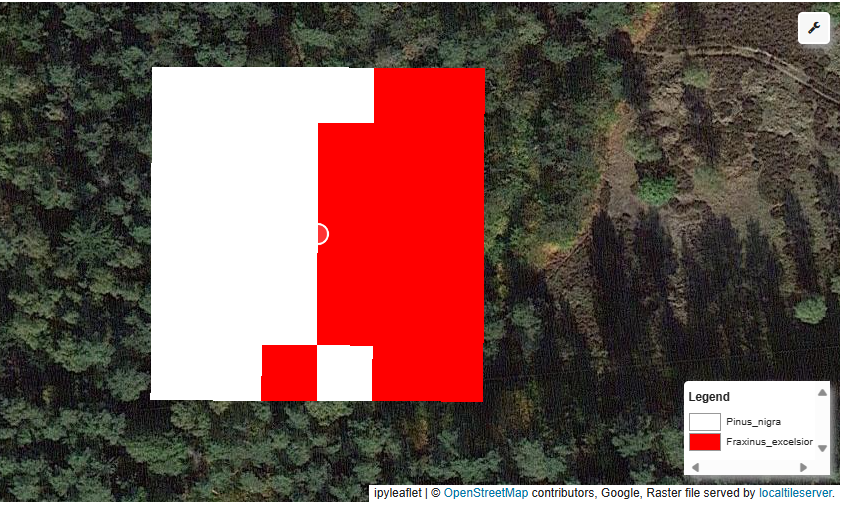

#### **Figure 9: Predicted image of Fraxinus_excelsior with mixed Pinus_nigra**

Predicted image as *Fraxinus_excelsior* that has mixed prediction. The image has 14 pixels predicted as Pinus_nigra species and 22 pixels predicted as *Fraxinus_excelsior*.

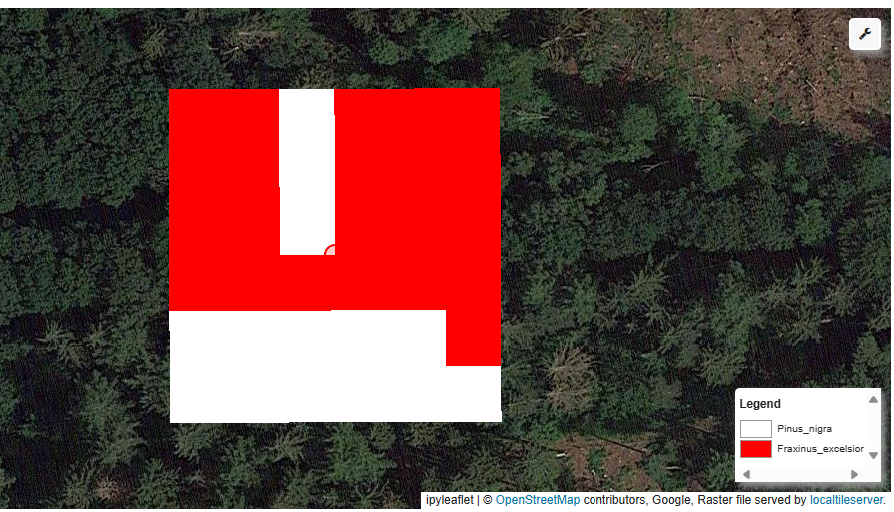

###**Results for Predicting 3 species (Pinus_nigra, Tilia_spec and Fraxinus_excelsior)**

##### **Figure 10: Distribution of tree species in each prediction image**

The x-axis show all the 321 test data which the random forest classifier
was used for the prediction. The y-axis show the prediction proportion of
the species for each of the 36 pixels per each test data image. From the predictions, we catergorized the predicted test data based on the majority of pixels in each image per each of the three species. *Fraxinus_excelsior *had the the highest majority of pixels predicted as *Fraxinus_excelsior*.

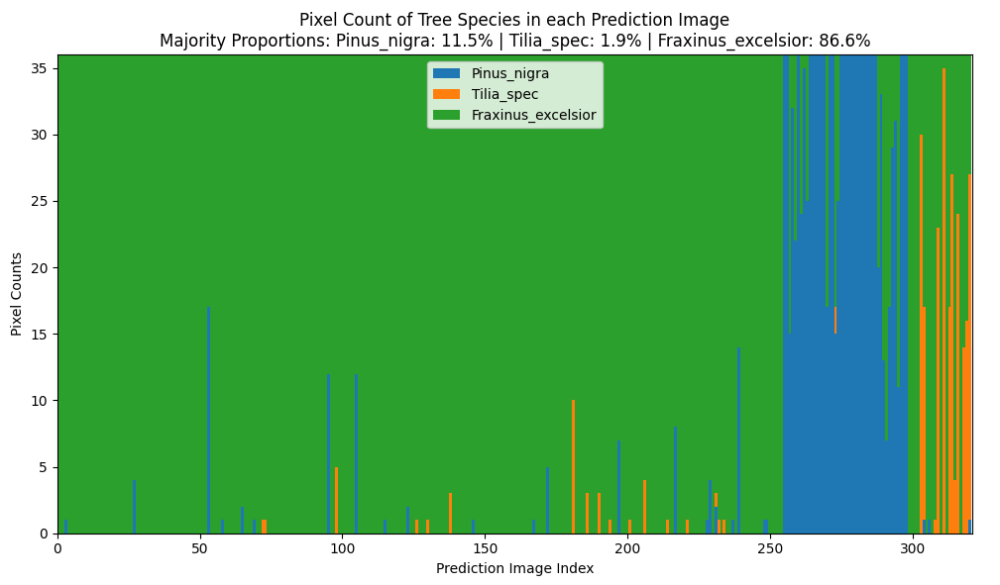

#####**Paths for prediction files and distribution of all tree species based on majority for each specie.**
Prediction(3 species) files are shared at this [link](https://drive.google.com/drive/folders/19nVhkvosBVsOAF3o8Q2r5dvmJa7DdKxZ?usp=drive_link).

The prediction files was divided into three species based on the majority mode prediction per species. *Pinus_nigra* (species 0) are saved in species [link](https://drive.google.com/drive/folders/12jbW7EKbaDCDbmLk6EdMGn65VLaCQWwk?usp=drive_link).

*Tilia_spec* (species_1) are saved in species [link](https://drive.google.com/drive/folders/19NmfllY215zU6pC7--KEWDtde2ub-t-Z?usp=drive_link).

*Fraxinus_excelsior* (species_2) are saved in species [link](https://drive.google.com/drive/folders/1bcm1ZbkPaWTIV1J5lnlTSUDK8o3Cv-pt?usp=drive_link).

In [ ]:
# Actual test file for the mixed classes
test_dir = f"{root}/MyDrive/EarthObservations/Presto_Project/data/Test_files"

# Path to folder
predictions_dir = f"{root}/MyDrive/EarthObservations/Presto_Project/data/predictions3"
species0_dir = f"{predictions_dir}/mode_species0"
species1_dir = f"{predictions_dir}/mode_species1"
species2_dir = f"{predictions_dir}/mode_species2"

# File paths
prediction304_cog = f"{predictions_dir}/" \
     "Tilia_spec._2_98255_WEFL_NLF_predicted_304_cog.tif"
#actual image
test304 = f"{test_dir}/" \
     "Tilia_spec._2_98255_WEFL_NLF.tif"

# list of species
SPECIES = ["Pinus_nigra", "Tilia_spec", "Fraxinus_excelsior"]

#####**Spatial distribution of all three species test images**

In [ ]:
# Function to get the center (lat, lon) of a raster in EPSG:4326
def get_raster_center(raster_path):
    with rasterio.open(raster_path) as src:
        bounds = src.bounds
        lon = (bounds.left + bounds.right) / 2
        lat = (bounds.bottom + bounds.top) / 2
        # Perform coordinate transformation to EPSG:4326
        transformer = pyproj.Transformer.from_crs(src.crs, 'EPSG:4326',
                                                  always_xy=True)
        lon, lat = transformer.transform(lon, lat)
        lat = lat
    return lat, lon

# Create a Leafmap map centered at an initial location
m = leafmap.Map(center=[52.4, 9.5], zoom=7)

# List and process the TIFF files in species0_dir
species0_files = [f for f in os.listdir(species0_dir) if f.endswith('.tif')]
#species0_files_count = len(species0_files)
#print(species0_files_count)
for filename in species0_files:
    filepath = os.path.join(species0_dir, filename)
    lat, lon = get_raster_center(filepath)
    # White markers for species 0
    m.add_markers([lat, lon], shape='circle', color='#FFFFFF')


# List and process the TIFF files in species1_dir
species1_files = [f for f in os.listdir(species1_dir) if f.endswith('.tif')]
for filename in species1_files:
    filepath = os.path.join(species1_dir, filename)
    lat, lon = get_raster_center(filepath)
    # Red markers for species 1
    m.add_markers([lat, lon], shape='circle', color='#ff0000')

# List and process the TIFF files in species1_dir
species2_files = [f for f in os.listdir(species2_dir) if f.endswith('.tif')]
for filename in species2_files:
    filepath = os.path.join(species2_dir, filename)
    lat, lon = get_raster_center(filepath)
    # Blue markers for species 2
    m.add_markers([lat, lon], shape='circle', color='#00bfff')


labels = ['Pinus_nigra', 'Tilia_spec', 'Fraxinus_excelsior']

colors = ['#FFFFFF', '#ff0000', '00bfff']

m.add_legend(title='Legend', labels=labels,
             colors=colors)

# Add basemap
m.add_basemap("SATELLITE")

# Display the map
m

The legend colors must be a list of tuples.


Map(center=[52.4, 9.5], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_…

#### **Figure 11: Spatial distribution of the predicted 321 tree species test data in Germany.**



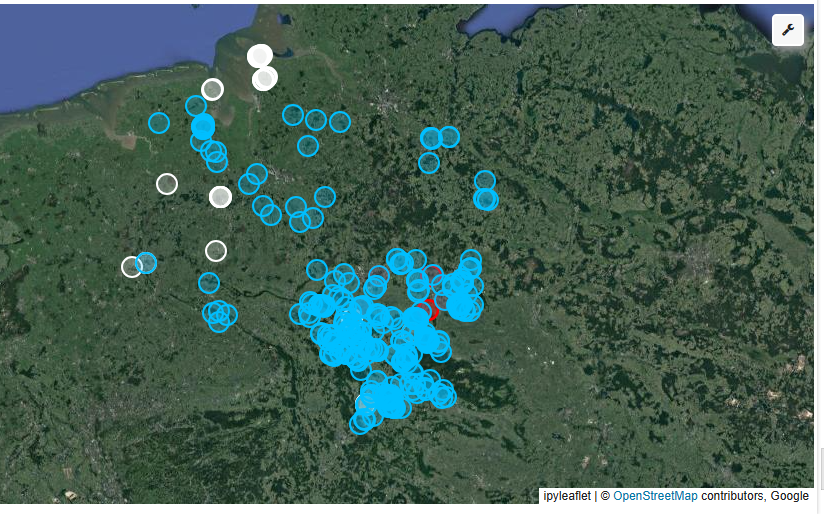

#####  **Display of single image with mixed prediction against the actual image**
This image has been predicted as *Fraxinus_excelsior* although the image has 19
pixels predicted as *Fraxinus_excelsior* species and 1 pixel predicted as Pinus_nigra and 16 pixels as Tilia_spec. Since *Fraxinus_excelsior* species has the greater proportion, the image is classified as an *Fraxinus_excelsior* species. The layer can switched to compare the actual image to the predicted image.

In [ ]:
# Create a Leafmap map centered at an initial location
# Use the center of the first raster as initial location
initial_location = get_raster_center(prediction304_cog)

m = leafmap.Map(center=initial_location, zoom=18)

# Add basemap
m.add_basemap("SATELLITE")

# Define a binary palette (0: white, 1: red) using hex codes
binary_palette = ['#FFFFFF', '#ff0000', '#00bfff']
marker_color = '#00bfff' #blue

lat, lon = initial_location

m.add_markers([lat, lon], shape='circle', color=marker_color)

# actual test file
m.add_raster(test304, band=2, palette=binary_palette, layer_name='Test Image 304')

# predicted image
m.add_raster(prediction304_cog, band=13, palette=binary_palette,
             layer_name='Predicted Image 304')

labels = ['Pinus_nigra', 'Tilia_spec', 'Fraxinus_excelsior']

colors = ['#FFFFFF', '#ff0000', '#00bfff']
m.add_legend(title='Legend', labels=labels,
             colors=colors)



# Display the map
m

INFO:large_image:Cannot use memcached for caching.


Map(center=[52.404896892705054, 9.906381770775875], controls=(ZoomControl(options=['position', 'zoom_in_text',…

#####**Display rasters for all the three species with mixed tree values.**

We display images that were classifed as 0 - *Pinus_nigra* but had mixed classification of 0 and 2 of the 36 images. These imaged are saved in [here](https://drive.google.com/drive/folders/1HTw2GRizvVl_BHSEMO8tI9HOUKfKmpqp?usp=drive_link)

Images that were prediction mode of 1 - *Tilia_spec* but had mixed classification of 0 and 1 [here](https://drive.google.com/drive/folders/1Z1j-L3aRiYpUoq2jG25Zx17jkkqo6S2t?usp=drive_link)

Images that were prediction mode of 2 (*Fraxinus_excelsior*) have mixed classification of 2 and 0 [here](https://drive.google.com/drive/folders/152tRPSeJYNTu43sAE20VMVDuJWWU87wT?usp=drive_link)

 Images that were prediction mode of 2 have mixed classification of 2, 1 and 0  [here](https://drive.google.com/drive/folders/1MWZ2Ou1XPD8huS3CDGHC2VscFPtefjzR?usp=drive_link)

In [ ]:
# list of actual mixed species
testfiles_0 = [
    f"{test_dir}/Pinus_nigra_2_50999_WEFL_NLF.tif",
    f"{test_dir}/Pinus_nigra_2_51340_WEFL_NLF.tif",
    f"{test_dir}/Pinus_nigra_2_52218_WEFL_NLF.tif"]

testfiles_1 = [f"{test_dir}/Tilia_spec._2_96553_WEFL_NLF.tif"]

testfiles_2 = [
    f"{test_dir}/Fraxinus_excelsior_2_30742_WEFL_NLF.tif",
    f"{test_dir}/Fraxinus_excelsior_4_31272_WEFL_NLF.tif",
    f"{test_dir}/Fraxinus_excelsior_2_329912_BI_NLF.tif",
    ]

testfiles_2all = [
    f"{test_dir}/Fraxinus_excelsior_9_30246_WEFL_NLF.tif",
    f"{test_dir}/Pinus_nigra_4_51863_WEFL_NLF.tif",
    f"{test_dir}/Tilia_spec._2_98255_WEFL_NLF.tif"]


# List of Species classified as 0 with (0,2) mixed classes
prediction_0_mixed = [
    f"{species0_dir}/Pinus_nigra_2_50999_WEFL_NLF_predicted_258_cog.tif",
    f"{species0_dir}/Pinus_nigra_2_51340_WEFL_NLF_predicted_259_cog.tif",
    f"{species0_dir}/Pinus_nigra_2_52218_WEFL_NLF_predicted_261_cog.tif"]

# List of Species classified as 1 with (0,1) mixed classes
prediction_1_mixed = [
    f"{species1_dir}/Tilia_spec._2_96553_WEFL_NLF_predicted_303_cog.tif"]

# List of Species classified as 2 with (2,0 or 2,1) all three mixed species
prediction_2_mixed = [
    f"{species2_dir}/Fraxinus_excelsior_2_30742_WEFL_NLF_predicted_27_cog.tif",
    f"{species2_dir}/Fraxinus_excelsior_4_31272_WEFL_NLF_predicted_138_cog.tif",
    f"{species2_dir}/Fraxinus_excelsior_2_329912_BI_NLF_predicted_53_cog.tif"]

    # List of Species classified as 2 with all three mixed species
prediction_2all_mixed = [
    f"{species2_dir}/Fraxinus_excelsior_9_30246_WEFL_NLF_predicted_231_cog.tif",
    f"{species2_dir}/Pinus_nigra_4_51863_WEFL_NLF_predicted_273_cog.tif",
    f"{species2_dir}/Tilia_spec._2_98255_WEFL_NLF_predicted_304_cog.tif"]



In [ ]:
m = leafmap.Map(center=initial_location, zoom=18)

# Add basemap
m.add_basemap("SATELLITE")

# Define a binary palette (0: white, 1: red) using hex codes
binary_palette = ['#FFFFFF', '#ff0000', '#00bfff']

# Add selected Actual images
for tiff in testfiles_0:
        # actual test file
    m.add_raster(tiff, band=2, palette=binary_palette,
                 layer_name='Test 1')

for tiff2 in testfiles_1:
        # actual test file
    m.add_raster(tiff2, band=2, palette=binary_palette,
                 layer_name='Test 2')

for tiff in testfiles_2:
        # actual test file
    m.add_raster(tiff, band=2, palette=binary_palette,
                 layer_name='Test 3')

for tiff in testfiles_2all:
        # actual test file
    m.add_raster(tiff, band=2, palette=binary_palette,
                 layer_name='Test 4')

# Add selected predicted rasters and markers

for cog in prediction_0_mixed:
    lat, lon = get_raster_center(cog)
    marker_color = '#FFFFFF' #white
    m.add_markers([lat, lon], shape='circle', color=marker_color)
    m.add_raster(cog, band=13, palette=binary_palette,
                 layer_name='Predicted (0) with mixed piexls(2,0)')

for cog in prediction_1_mixed:
    lat, lon = get_raster_center(cog)
    marker_color = '#ff0000' #red
    m.add_markers([lat, lon], shape='circle', color=marker_color)
    m.add_raster(cog, band=13, palette=binary_palette,
                 layer_name='Predicted (1) with mixed piexls(1,0)')

for cog in prediction_2_mixed:
    lat, lon = get_raster_center(cog)
    marker_color = '#00bfff' #blue
    m.add_markers([lat, lon], shape='circle', color=marker_color)
    m.add_raster(cog, band=13, palette=binary_palette,
                 layer_name='Predicted(2) with mixed piexls(2,0)')

for cog in prediction_2all_mixed:
    lat, lon = get_raster_center(cog)
    marker_color = '#00bfff' #blue
    m.add_markers([lat, lon], shape='circle', color=marker_color)
    m.add_raster(cog, band=13, palette=binary_palette,
                 layer_name='Predicted (2) with All of 3 species')


labels = ['Pinus_nigra', 'Tilia_spec', 'Fraxinus_excelsior']

colors = ['#FFFFFF', '#ff0000', '#00bfff']
m.add_legend(title='Legend', labels=labels,
             colors=colors)
# Display the map
m

Map(center=[52.404896892705054, 9.906381770775875], controls=(ZoomControl(options=['position', 'zoom_in_text',…

#### **Figure 12: Zoomed Predicted Fraxinus_excelsior with mixed Pinus_nigra and Tilia_spec species**
This image has be predicted as *Fraxinus_excelsior* although it has 19
pixels predicted as *Fraxinus_excelsior* species and 1 pixel as Pinus_nigra and 16 pixels as *Tilia_spec*. Since *Fraxinus_excelsior*  species has the greater proportion, the image is classified as an *Fraxinus_excelsior* species.

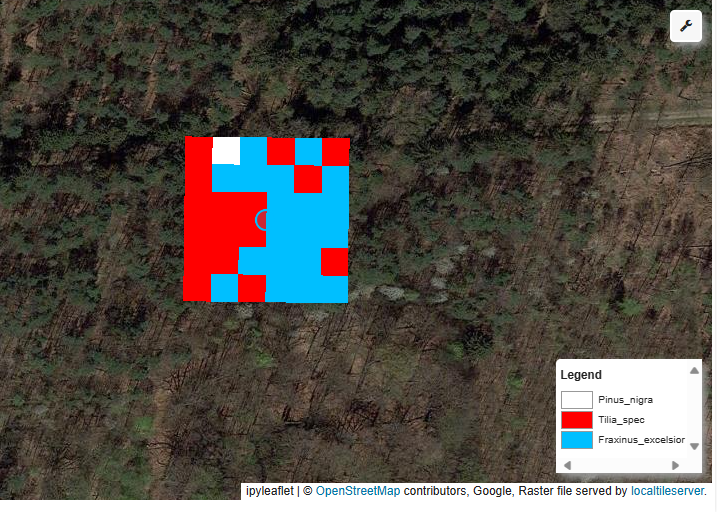

#### **Figure 13: Zoomed Predicted Pinus_nigra with mixed species prediction of Pinus_nigra and Fraxinus_excelsior.**

Although both images have mixed species, they are classified as *Pinus_nigra*
because it has the highest number of predicted pixels.

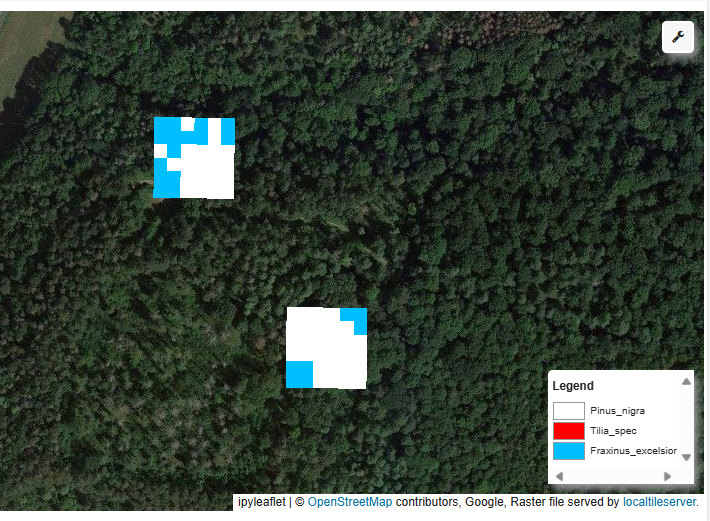

###**Project limitation, Improvement and next steps**

Our project was organized in two phases, each with distinct objectives. Initially, our focus was on comprehending the Presto model from the creators and then leveraging it to first  generate predictions for the provided test data. Secondly after thoroughly understanding and getting the model to generate predictions, we planned  to apply it to busia_cropland_binary_2020.tif dataset.

The project demonstrated significant progress towards realizing its aims, particularly in the application of the Presto model for predictive tasks. The results indicated successful predictions for two and three tree species, "*Abies_alba*" and "*Acer_pseudoplatanus*," "*Pinus_nigra*", "*Fraxinus_excelsior*", and "*Tilia_spec*" on the provided test data.

A 10-meter resolution map depicting cropland in Busia County, Kenya during the 2020-2021 growing season, presented an essential binary classification challenge. The binary map utilized a coding system where 0 denoted no cropland, and 1 indicated the presence of cropland.

The next steps of our project involve refining the Presto model to be able to make predictions of cropland within a 10-meter resolution (for example map of Busia County in Kenya.)

As a group project, individual efforts were integral to the overall success. Collaboration was evident in addressing challenges, sharing insights, and collectively problem-solving. The integration of individual results occurred through a shared understanding of the Presto model, fostering a cohesive approach to tackle the complexities of the project.

**Author Contribution:**
**AA:** Conceptualization, Methodology, Writing - proposal preparation, Data curation, Formal Analysis, Software, Validation, Visualization.
**KA:** Conceptualization, Methodology, Writing - Proposal preparation, Software, Resources, Data curation, Review & Editing.
**ALOD:** Conceptualization, Writing - Proposal preparation, Methodology, Data Curation, Software, Formal Analysis, Validation, and Visualization.

The authors would like to acknowledge TreeSatAI for providing the data for this project. We are grateful to Professor Lyndon Estes (Course Instructor) and Mike Cecil (doctoral candidate at the Graduate School of Geography) for their valuable input and assistance during the various stages of this project.

##**References**

Bourcier, J., Dashyan, G., Chanussot, J., & Alahari, K. (2022). Evaluating the label efficiency of contrastive self-supervised learning for multi-resolution satellite imagery. In Image and Signal Processing for Remote Sensing XXVIII (Vol. 12267, pp. 152-161). SPIE.

Jain, M., Mondal, P., DeFries, R. S., Small, C., & Galford, G. L. (2013). Mapping cropping intensity of smallholder farms: A comparison of methods using multiple sensors. Remote Sensing of Environment, 134, 210-223.

Kluger, D. M., Wang, S., & Lobell, D. B. (2021). Two shifts for crop mapping: Leveraging aggregate crop statistics to improve satellite-based maps in new regions. Remote Sensing of Environment, 262, 112488.

Rogan, J., & Chen, D. (2004). Remote sensing technology for mapping and monitoring land-cover and land-use change. Progress in planning, 61(4), 301-325.

Sakamoto, T., Sprague, D. S., Okamoto, K., & Ishitsuka, N. (2018). Semi-automatic classification method for mapping the rice-planted areas of Japan using multi-temporal Landsat images. Remote Sensing Applications: Society and Environment, 10, 7-17.

Song, L., Estes, A. B., & Estes, L. D. (2023). A super-ensemble approach to map land cover types with high resolution over data-sparse African savanna landscapes. International Journal of Applied Earth Observation and Geoinformation, 116, 103152.

Tong, X. Y., Xia, G. S., & Zhu, X. X. (2023). Enabling country-scale land cover mapping with meter-resolution satellite imagery. ISPRS Journal of Photogrammetry and Remote Sensing, 196, 178-196.

Tseng, G., Kerner, H., Nakalembe, C., & Becker-Reshef, I. (2020). Kenya Cropland Map and Non-Crop Labelled dataset [Data set]. Zenodo. https://doi.org/10.5281/zenodo.4271144

Tseng, G., Zvonkov, I., Purohit, M., Rolnick, D., & Kerner, H. (2023). Lightweight, Pre-trained Transformers for Remote Sensing Timeseries. arXiv preprint arXiv:2304.14065.

Verburg, P. H., Van De Steeg, J., Veldkamp, A., & Willemen, L. (2009). From land cover change to land function dynamics: A major challenge to improve land characterization. Journal of environmental management, 90(3), 1327-1335.

